In [64]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io.wavfile import read, write
from IPython.display import Audio
from numpy.fft import fft,ifft

In [65]:
Fs,data = read('StarWars60.wav')
print('Length of data:',len(data))
print('Sampling frequency',Fs)
print('Number of seconds: ',len(data)/Fs)

Length of data: 1323000
Sampling frequency 22050
Number of seconds:  60.0


In [66]:
Audio(data,rate=Fs)

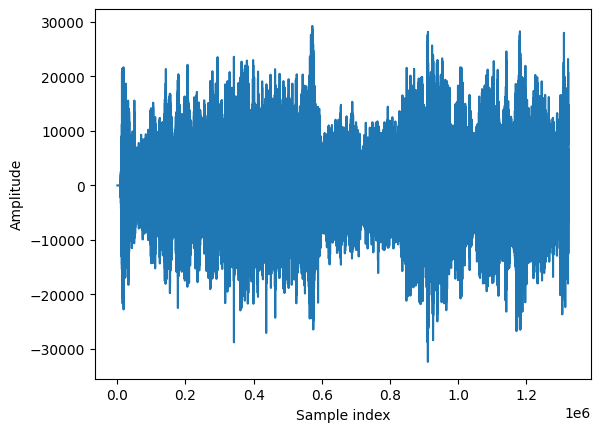

In [67]:
plt.figure()
plt.plot(data)
plt.xlabel('Sample index')
plt.ylabel('Amplitude')
plt.show()

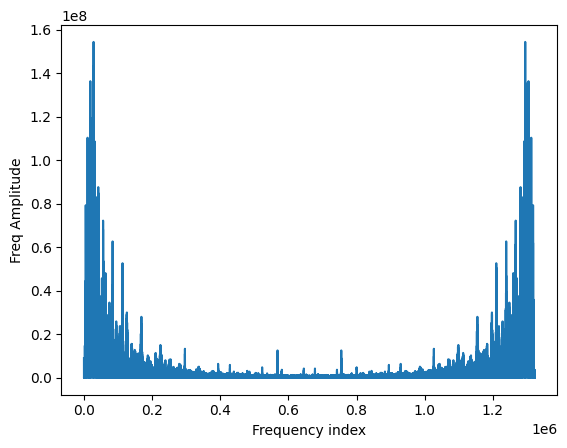

In [68]:
plt.figure()
freq_data=fft(data)
plt.plot(np.abs(freq_data))
plt.xlabel('Frequency index')
plt.ylabel('Freq Amplitude')
plt.show()

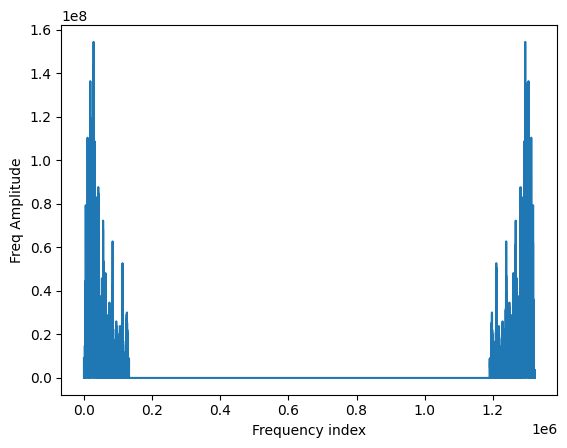

In [69]:
len(freq_data), len(data)
freq_data[1],freq_data[-1]

# Low-pass filter
cutoff=0.1
cutoff_ix=int(cutoff*len(data))
LPF=np.ones(len(data))
LPF[cutoff_ix+1:-cutoff_ix]=0

freq_data_LPF = LPF*freq_data
data_LPF = ifft(freq_data_LPF)
plt.figure()
freq_data=fft(data)
plt.plot(np.abs(freq_data_LPF))
plt.xlabel('Frequency index')
plt.ylabel('Freq Amplitude')
plt.show()

In [70]:
Audio(data_LPF,rate=Fs)

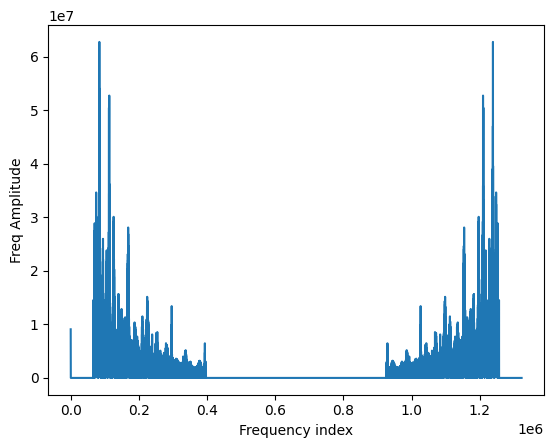

In [71]:
# Band-pass filter
cutoff=0.3
cutoff_st = 0.05

# Low-pass
cutoff_ix=int(cutoff*len(data))
LPF=np.ones(len(data))
LPF[cutoff_ix+1:-cutoff_ix]=0

# High-pass
cutoff_st_index=int(cutoff_st*len(data))
LPF[1:cutoff_st_index+1]=0
LPF[-cutoff_st_index:]=0

freq_data_LPF = LPF*freq_data
data_LPF = ifft(freq_data_LPF)
plt.figure()
freq_data=fft(data)
plt.plot(np.abs(freq_data_LPF))
plt.xlabel('Frequency index')
plt.ylabel('Freq Amplitude')
plt.show()
Audio(data_LPF,rate=Fs)